<a href="https://colab.research.google.com/github/SemanticComputing/parliamentsampo-mention-networks/blob/main/speech_reference_network_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Directed mention network of MPs


In this notebook directed mention network between members of Parliament (MPs) is created and analyzed. MPs are nodes and directed link describes mention from one MP to another. Link weight corresponds to number of speeches in which first MP has mentioned other MPs.

## Libraries

In [ ]:
#!pip install --upgrade SPARQLWrapper numpy rdflib scipy matplotlib pandas networkx sklearn
!pip install python-louvain rdflib SPARQLWrapper
!pip install cdlib
%matplotlib inline

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import codecs

from collections import defaultdict, OrderedDict, Counter
from datetime import datetime, timedelta
from dateutil.relativedelta import relativedelta
from itertools import product, combinations, chain

from matplotlib import pyplot as plt
from matplotlib import cm, colors
from cdlib import algorithms
import networkx as nx
import networkx.algorithms.community as  nxcommunity
import numpy    as np
from scipy.cluster.hierarchy import dendrogram, linkage
import pandas   as pd
import rdflib as rdflib
from rdflib.namespace import XSD, RDF, RDFS, Namespace, SKOS, OWL
import re
from scipy.interpolate import interp1d
from scipy.signal import convolve2d
import seaborn as sns
from sklearn.preprocessing import MultiLabelBinarizer, minmax_scale
from SPARQLWrapper import SPARQLWrapper, JSON, POST
import sys
from typing import Dict, List, Set, Tuple, Type, Union

import IPython
import pprint

## Functions


by Petri Leskinen

In [ ]:
def checkDate(v):
  try:
    d = datetime.strptime(v, '%Y-%m-%dT%H:%M:%S').date()
  except ValueError:
    '''
    cases e.g. 29th february of a non-loop year
    '''
    m = re.match(r'(\d{4})-(\d{2})-(\d{2})', v)
    d = datetime(int(m.groups()[0]), int(m.groups()[1]), 28).date()
  return d

DATATYPECONVERTERS = {
      str(XSD.integer):  int,
      str(XSD.decimal):  float,
      str(XSD.date):     lambda v: datetime.strptime(v, '%Y-%m-%d').date(),
      str(XSD.dateTime): checkDate
  }

def convertDatatype(obj):
  return DATATYPECONVERTERS.get(obj.get('datatype'), str)(obj.get('value'))

def convertDatatypes(results):
    res = results["results"]["bindings"]
    return [dict([(k, convertDatatype(v)) for k,v in r.items()]) for r in res]

In [ ]:
from scipy.stats import rankdata

def set_stats_and_ranks(G, dct, prop = 'degree', cond = (lambda x: x>0)):
  arr = sorted(dct, key=lambda x: x[-1], reverse=True)

  for (k,v), r in zip(arr, rankdata([-v for _,v in arr], method='min')):
    if cond(v):
      # NB exporting to graphml does not support dictionaries as property values
      # G.nodes[k][prop] = {'value': v, 'rank': r} will cause an error
      G.nodes[k][prop] = v

In [ ]:
def generateGraph(nodes: Dict, links: Dict) -> (nx.Graph):

    G = nx.DiGraph()

    #    get all other fields except 'id' in nodes,
    #    e.g. queried parameters in SELECT ?label ?gender ...:
    node_keys = set([key for ob in nodes for key in ob.keys()]) - set(['party'])

    for ob in nodes:
        _id = ob['id']
        if _id in G: # Set the group of MP as the latest group MP has belonged to
          if G.nodes[_id]['date'] < ob['date']:
            G.nodes[_id]['date'] = ob['date']
            G.nodes[_id]['group'] = ob['group']
            G.nodes[_id]['color'] = ob['color']
        else:
          G.add_node(_id)
          for key in node_keys:
              v = ob.get(key)
              if v:
                  G.nodes[_id][key] = v

    #    get all other fields except 'source' and 'target' in nodes,
    #    e.g. queried parameters in SELECT ?x ?y ...:
    edge_keys = set([key for ob in links for key in ob.keys()]) - set(['source', 'target'])

    for ob in links:
        src, trg = ob['source'], ob['target']
        #if src != trg: # Are the references to oneself allowed
        G.add_edge(src, trg)

        #   add query results:
        for key in edge_keys:
            v = ob.get(key)
            if v:
                G.edges[src, trg][key] = v

    return G

In [ ]:
def drawGraph(G,
              pos=None,
              node_color='#1f78b4',
              size_scale = [100,1500],
              node_size='degree',
              cmap = plt.get_cmap('viridis'),
              labels = None,
              font_size = 16,
              gov_legend=False,
              weight='weight'):
  if pos is None:
    print("Adjusting layout ...")
    pos = nx.drawing.layout.fruchterman_reingold_layout(G, iterations=200)

  fig = plt.figure(figsize=[40.0, 24.0])

  ax = fig.add_subplot(111)

  edge_weights = [e.get(weight,1) for _,_,e in G.edges(data=True)]
  scale_weight =  interp1d([min(edge_weights),max(edge_weights)],[1,20])
  nx.drawing.draw_networkx_edges(G,
                                width=scale_weight(edge_weights),
                                pos=pos,
                                alpha=0.2,
                                edge_color='grey',
                                #connectionstyle='arc3, rad = 0.1'
                                )

  # set node size by the pagerank, and scale it to range [50,...]
  nodesizes = [e.get(node_size, 1) for _,e in G.nodes(data=True)]
  scale_size = interp1d([min(nodesizes),max(nodesizes)], size_scale)

  nx.drawing.draw_networkx_nodes(G,
                                pos=pos,
                                node_size=scale_size(nodesizes),
                                node_color = node_color,
                                #edgecolors = 'black',
                                cmap = cmap,
                                alpha=0.8
                                )

  if labels:
    nx.drawing.draw_networkx_labels(G,
                              pos=pos,
                              font_size = font_size,
                              labels = labels)
  if gov_legend:
    plt.scatter([],[], c='#0F4DBC', label='Goverment')
    plt.scatter([],[], c='#BF1E24', label='Opposition')
    plt.legend()

  plt.show()
  return pos

# Constants

Constants related to the queries

In [ ]:
ENDPOINT = "http://ldf.fi/semparl/sparql"

PREFIXES = """
PREFIX bioc: <http://ldf.fi/schema/bioc/>
PREFIX crm: <http://erlangen-crm.org/current/>
PREFIX dct: <http://purl.org/dc/terms/>
PREFIX districts: <http://ldf.fi/semparl/groups/districts/>
PREFIX event: <http://ldf.fi/semparl/event/>
PREFIX foaf: <http://xmlns.com/foaf/0.1/>
PREFIX groups: <http://ldf.fi/semparl/groups/>
PREFIX label: <http://ldf.fi/semparl/label/>
PREFIX occupations: <http://ldf.fi/semparl/occupations/>
PREFIX owl: <http://www.w3.org/2002/07/owl#>
PREFIX people: <http://ldf.fi/semparl/people/>
PREFIX places: <http://ldf.fi/semparl/places/>
PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
PREFIX rdfs: <http://www.w3.org/2000/01/rdf-schema#>
PREFIX roles: <http://ldf.fi/semparl/roles/>
PREFIX schema: <http://schema.org/>
PREFIX semparls: <http://ldf.fi/schema/semparl/>
PREFIX skos: <http://www.w3.org/2004/02/skos/core#>
PREFIX times: <http://ldf.fi/semparl/times/>
PREFIX eterms: <http://ldf.fi/semparl/times/electoral-terms/>
PREFIX titles: <http://ldf.fi/semparl/titles/>
PREFIX xml: <http://www.w3.org/XML/1998/namespace>
PREFIX xsd: <http://www.w3.org/2001/XMLSchema#>
PREFIX semparl_linguistics: <http://ldf.fi/schema/semparl/linguistics/>
"""

Time period and corresponding electoral term from which speeches are queried


In [ ]:
_start, _end = '2015-04-22', '2019-04-16'
#_start, _end = '2019-04-24', '2022-05-31'

term =  'e_2015-04-22-2019-04-16'
#term = 'e_2019-04-17-2023-04-05'

# Query mentions between MPs

In [ ]:
sparql = SPARQLWrapper(ENDPOINT)
sparql.setQuery(PREFIXES+"""
SELECT DISTINCT ?source ?target (COUNT(DISTINCT ?sp) AS ?weight) WHERE {
  BIND('<START>'^^xsd:date AS ?start)
  BIND('<END>'^^xsd:date AS ?end)

 ?sp semparl_linguistics:referenceToPerson/skos:relatedMatch ?target ;
     semparls:speaker ?source ;
     dct:date ?date .
  ?sp dct:language <http://id.loc.gov/vocabulary/iso639-2/fin> . # Do not take Swedish speeches into account
  FILTER (?start<=?date && ?date <= ?end)
  ?sp semparls:speechType ?type .
  FILTER (?type != <http://ldf.fi/semparl/speechtypes/PuhemiesPuheenvuoro>) . # Filter speeches of the Speaker of the Parliament

  # Filter that referenced person (?target) is a current MP or minister
  VALUES ?eclass {
    semparls:ParliamentMembership
    semparls:ParliamentaryGroupMembership
	semparls:GovernmentMembership
  }
  ?target bioc:bearer_of/crm:P11i_participated_in [
      a ?eclass ;
      crm:P4_has_time-span ?tspan ] .

  ?tspan crm:P81a_begin_of_the_begin ?t_start .
  OPTIONAL { ?tspan crm:P82b_end_of_the_end ?t_end }

  FILTER (?t_start <= ?date && (!BOUND(?t_end) || ?date <= ?t_end))
  FILTER (?source != ?target)
}
GROUPBY ?source ?target """.replace("<START>", _start).replace("<END>", _end))

sparql.setReturnFormat(JSON)
sparql.setMethod(POST)

results = sparql.query().convert()
results2 = convertDatatypes(results)
print("Number of links:", len(results2))

Number of links: 13169


# Query MPs and their parties

In [ ]:
# Get unique node ids from the links
uniq_ids = set({ob.get('source') for ob in results2}) | set({ob.get('target') for ob in results2})
BLOCK = ' '.join({"<{}>".format(s) for s in uniq_ids})
print(len(uniq_ids))
q = """
SELECT DISTINCT ?id ?label ?group ?date (sample(?colors) AS ?color) WHERE {
  VALUES ?id { <BLOCK> }
  ?id skos:prefLabel ?label .
  ?id semparls:has_party_membership ?partyms .
  ?partyms semparls:party ?group .
  ?group semparls:hexcolor ?colors .
  ?partyms crm:P4_has_time-span ?tspan .
  ?tspan crm:P81a_begin_of_the_begin ?date .
} GROUP BY ?id ?label ?group ?date""".replace('<BLOCK>', BLOCK)

sparql.setQuery(PREFIXES + q)
results = sparql.query().convert()

vars = results['head']['vars']
res_nodes = convertDatatypes(results)

for ob in res_nodes[:10]:
  print(ob)

216
{'id': 'http://ldf.fi/semparl/people/p917', 'label': 'Arhinmäki, Paavo (1976-)', 'group': 'http://ldf.fi/semparl/groups/Q385927', 'date': datetime.date(2007, 3, 21), 'color': '#BF1E24'}
{'id': 'http://ldf.fi/semparl/people/p811', 'label': 'Paloniemi, Aila (1956-)', 'group': 'http://ldf.fi/semparl/groups/Q506591', 'date': datetime.date(2003, 3, 19), 'color': '#01954B'}
{'id': 'http://ldf.fi/semparl/people/p1147', 'label': 'Lindtman, Antti (1982-)', 'group': 'http://ldf.fi/semparl/groups/Q499029', 'date': datetime.date(2011, 4, 20), 'color': '#E11931'}
{'id': 'http://ldf.fi/semparl/people/p392', 'label': 'Ala-Nissilä, Olavi (1949-)', 'group': 'http://ldf.fi/semparl/groups/Q506591', 'date': datetime.date(1991, 3, 22), 'color': '#01954B'}
{'id': 'http://ldf.fi/semparl/people/p175', 'label': 'Kankaanniemi, Toimi (1950-)', 'group': 'http://ldf.fi/semparl/groups/Q1138982', 'date': datetime.date(1987, 3, 21), 'color': '#2B67C9'}
{'id': 'http://ldf.fi/semparl/people/p1331', 'label': 'Honkon

In [ ]:
# Query parties
uniq_ids2 = set({ob.get('group') for ob in res_nodes})
BLOCK2 = ' '.join({"<{}>".format(s) for s in uniq_ids2})

q = """
SELECT DISTINCT ?group ?label WHERE {
  VALUES ?group { <BLOCK> }
  ?group skos:prefLabel ?label .
  FILTER(LANG(?label)='fi') .
  }""".replace('<BLOCK>', BLOCK2)

sparql.setQuery(PREFIXES + q)
results = sparql.query().convert()
res_labels = convertDatatypes(results)

group_names = {}
for ob in res_labels:
  group_names[ob['group']] = ob['label']
print(group_names)

{'http://ldf.fi/semparl/groups/Q634277': 'Perussuomalaiset', 'http://ldf.fi/semparl/groups/Q58868602': 'Seitsemän tähden liike', 'http://ldf.fi/semparl/groups/Q385927': 'Vasemmistoliitto', 'http://ldf.fi/semparl/groups/Q304191': 'Kansallinen Kokoomus', 'http://ldf.fi/semparl/groups/Q845537': 'Suomen ruotsalainen kansanpuolue', 'http://ldf.fi/semparl/groups/Q52157683': 'Liike Nyt', 'http://ldf.fi/semparl/groups/Q1854411': 'Suomen Maaseudun Puolue', 'http://ldf.fi/semparl/groups/Q506591': 'Suomen Keskusta', 'http://ldf.fi/semparl/groups/Q196695': 'Vihreä liitto', 'http://ldf.fi/semparl/groups/Q499029': 'Suomen Sosialidemokraattinen Puolue', 'http://ldf.fi/semparl/groups/Q1138982': 'Suomen Kristillisdemokraatit', 'http://ldf.fi/semparl/groups/Q30337076': 'Korjausliike'}


In [ ]:
# Government parties
goverment = ['http://ldf.fi/semparl/groups/Q30337076', 'http://ldf.fi/semparl/groups/Q634277', 'http://ldf.fi/semparl/groups/Q506591','http://ldf.fi/semparl/groups/Q304191']
# Colors for government/opposition for visualisations
gov_c = '#0F4DBC'
opp_c = '#BF1E24'

# Query Committees

In [ ]:
# Take into account committees only when MP has been member of committee at least x days
days = 100

In [ ]:
q = """
SELECT ?person ?name (COUNT(DISTINCT ?committee_et) AS ?committees) (GROUP_CONCAT(DISTINCT ?label ; separator=',') AS ?committee_names)  WHERE {
    VALUES ?person {<BLOCK>}
  	?committee rdfs:subClassOf semparls:Committee .
    ?committee_et rdfs:subClassOf ?committee .
  	?committee_et crm:P10_falls_within eterms:<TERM> .
    ?committee skos:prefLabel ?label .
  	FILTER(LANG(?label)='fi') .
    FILTER CONTAINS(?label, 'valiokunta') .                           # take only committees into account
    ?event semparls:organization ?committee_et .
    ?person bioc:bearer_of ?event2 .
    ?event2 a ?role .
    FILTER(?role IN (roles:r2, roles:r8, roles:r9)) . # jäsen/puheenjohtaja/varapuheenjohtaja
    ?event2 crm:P11i_participated_in ?event .
    ?person skos:prefLabel ?name .
    ?event crm:P4_has_time-span ?tspan .
    ?tspan crm:P81a_begin_of_the_begin ?tstart .
    OPTIONAL {?tspan crm:P82b_end_of_the_end ?tend} .
    BIND(?tend-?tstart as ?dtime) .
    FILTER (!BOUND(?tend) || ?dtime >= "P<DAYS>DT0H0M0.000S"^^xsd:duration) # Kuulunut vähintään 100 päivää valiokuntaan

} GROUP BY ?person ?name
ORDER BY DESC(?committees)""".replace('<DAYS>', str(days)).replace('<BLOCK>', BLOCK).replace('<TERM>',term)

sparql.setQuery(PREFIXES + q)
results = sparql.query().convert()
res_committees = convertDatatypes(results)




In [ ]:
total_memberships = 0
for ob in res_committees:
  committees = sorted(ob['committee_names'].split(","))
  total_memberships += len(committees)
  for ob2 in res_nodes:
    if ob['person'] == ob2['id']:
      ob2['committees'] = committees
      break

for ob in res_nodes[:10]:
  print(ob)
print("Number of committee memberships that lasted over {:d} days:".format(days), total_memberships)
print("{} MPs have belonged to some committee at least {:d} days, and have mentioned some othed MP/have been mentioned)".format(len(res_committees), days))

{'id': 'http://ldf.fi/semparl/people/p917', 'label': 'Arhinmäki, Paavo (1976-)', 'group': 'http://ldf.fi/semparl/groups/Q385927', 'date': datetime.date(2007, 3, 21), 'color': '#BF1E24', 'committees': ['Suuri valiokunta', 'Ulkoasiainvaliokunta']}
{'id': 'http://ldf.fi/semparl/people/p811', 'label': 'Paloniemi, Aila (1956-)', 'group': 'http://ldf.fi/semparl/groups/Q506591', 'date': datetime.date(2003, 3, 19), 'color': '#01954B', 'committees': ['Tulevaisuusvaliokunta', 'Ulkoasiainvaliokunta', 'Valtiovarainvaliokunta']}
{'id': 'http://ldf.fi/semparl/people/p1147', 'label': 'Lindtman, Antti (1982-)', 'group': 'http://ldf.fi/semparl/groups/Q499029', 'date': datetime.date(2011, 4, 20), 'color': '#E11931', 'committees': ['Tulevaisuusvaliokunta']}
{'id': 'http://ldf.fi/semparl/people/p392', 'label': 'Ala-Nissilä, Olavi (1949-)', 'group': 'http://ldf.fi/semparl/groups/Q506591', 'date': datetime.date(1991, 3, 22), 'color': '#01954B', 'committees': ['Liikenne- ja viestintävaliokunta', 'Suuri valio

In [ ]:
# Query names of the committees
q = """
SELECT DISTINCT ?committee ?label
WHERE {
  ?committee rdfs:subClassOf semparls:Committee .
  ?committee_et rdfs:subClassOf ?committee .
  ?committee_et crm:P10_falls_within eterms:<TERM> . # Electoral term
  ?committee skos:prefLabel ?label .
  FILTER(LANG(?label)='fi') .
  FILTER CONTAINS(?label, 'valiokunta') .
} ORDER BY (?label)""".replace('<TERM>',term)

sparql.setQuery(PREFIXES + q)
results = sparql.query().convert()
res_committees2 = convertDatatypes(results)


In [ ]:
committee_names = [c['label']  for c in res_committees2]
committee_names

['Hallintovaliokunta',
 'Lakivaliokunta',
 'Liikenne- ja viestintävaliokunta',
 'Maa- ja metsätalousvaliokunta',
 'Perustuslakivaliokunta',
 'Puolustusvaliokunta',
 'Sivistysvaliokunta',
 'Sosiaali- ja terveysvaliokunta',
 'Suuri valiokunta',
 'Talousvaliokunta',
 'Tarkastusvaliokunta',
 'Tulevaisuusvaliokunta',
 'Työelämä- ja tasa-arvovaliokunta',
 'Ulkoasiainvaliokunta',
 'Valtiovarainvaliokunta',
 'Ympäristövaliokunta']

# Create graph

In [ ]:
# Output node and link data in the networkx graph
G = generateGraph(res_nodes, results2)
# Remove MPs that were MPs for very short time (under 2 weeks) during 2015-2018 term
G.remove_nodes_from(['http://ldf.fi/semparl/people/p920', 'http://ldf.fi/semparl/people/p1381'])

print('Samples of links:')
for e in list(G.edges(data=True))[:10]:
  print(e)
print('...')
print('Samples of nodes:')
for u in list(G.nodes(data=True))[:10]:
  print(u)



Samples of links:
('http://ldf.fi/semparl/people/p917', 'http://ldf.fi/semparl/people/p499', {'weight': 4})
('http://ldf.fi/semparl/people/p917', 'http://ldf.fi/semparl/people/p214', {'weight': 1})
('http://ldf.fi/semparl/people/p917', 'http://ldf.fi/semparl/people/p212', {'weight': 2})
('http://ldf.fi/semparl/people/p917', 'http://ldf.fi/semparl/people/p592', {'weight': 7})
('http://ldf.fi/semparl/people/p917', 'http://ldf.fi/semparl/people/p1091', {'weight': 1})
('http://ldf.fi/semparl/people/p917', 'http://ldf.fi/semparl/people/p1092', {'weight': 4})
('http://ldf.fi/semparl/people/p917', 'http://ldf.fi/semparl/people/p1093', {'weight': 1})
('http://ldf.fi/semparl/people/p917', 'http://ldf.fi/semparl/people/p1094', {'weight': 6})
('http://ldf.fi/semparl/people/p917', 'http://ldf.fi/semparl/people/p1096', {'weight': 1})
('http://ldf.fi/semparl/people/p917', 'http://ldf.fi/semparl/people/p1097', {'weight': 3})
...
Samples of nodes:
('http://ldf.fi/semparl/people/p917', {'group': 'http:

In [ ]:
dct1 = G.out_degree(weight='weight')
set_stats_and_ranks(G, dct1, 'out_degree')
dct_in = G.in_degree(weight='weight')
set_stats_and_ranks(G, dct_in, 'in_degree')

to_be_removed = []

for n,d in list(G.nodes(data=True)):
  if 'out_degree' not in d:
    G.nodes[n]['out_degree'] = 0
  if 'in_degree' not in d:
    G.nodes[n]['in_degree'] = 0
  if 'group' not in d: # Remove people that do not belong to any group/party or are not MPs, like http://ldf.fi/semparl/people/Q11887755
    to_be_removed.append(n)
  if 'committees' not in d:
    G.nodes[n]['committees'] = []

G.remove_nodes_from(to_be_removed)

In [ ]:
to_be_removed

['http://ldf.fi/semparl/people/Q11887755',
 'http://ldf.fi/semparl/people/Q100605132',
 'http://ldf.fi/semparl/people/Q23040773']

MPs that have not belonged to any committees for longer time are ministers.

In [ ]:
arr = sorted(G.edges(data=True), key=lambda x: x[-1].get('weight'), reverse=True)
print("Edges with the largest weights")
for v1,v2,u in arr[:10]:
  print('{:2d}  {:30s} {:35s} {:30s} {:35s}'.format(u['weight'], G.nodes[v1]['label'], v1, G.nodes[v2]['label'], v2))

Edges with the largest weights
105  Viitanen, Pia (1967-)          http://ldf.fi/semparl/people/p511   Heinäluoma, Eero (1955-)       http://ldf.fi/semparl/people/p768  
85  Rinne, Antti (1962-)           http://ldf.fi/semparl/people/p1274  Orpo, Petteri (1969-)          http://ldf.fi/semparl/people/p947  
84  Rinne, Antti (1962-)           http://ldf.fi/semparl/people/p1274  Sipilä, Juha (1961-)           http://ldf.fi/semparl/people/p1108 
83  Viitanen, Pia (1967-)          http://ldf.fi/semparl/people/p511   Orpo, Petteri (1969-)          http://ldf.fi/semparl/people/p947  
79  Arhinmäki, Paavo (1976-)       http://ldf.fi/semparl/people/p917   Sipilä, Juha (1961-)           http://ldf.fi/semparl/people/p1108 
77  Viitanen, Pia (1967-)          http://ldf.fi/semparl/people/p511   Harakka, Timo (1962-)          http://ldf.fi/semparl/people/p1326 
71  Hoskonen, Hannu (1957-)        http://ldf.fi/semparl/people/p797   Sipilä, Juha (1961-)           http://ldf.fi/semparl/people/p1108 
68

In [ ]:
arr_pairs = {}
for v1,v2,u in arr:
  if (v1,v2) in arr_pairs:
    arr_pairs[(v1,v2)]+= u['weight']
  elif (v2,v1) in arr_pairs:
    arr_pairs[(v2,v1)] += u['weight']
  else:
    arr_pairs[(v1,v2)] = u['weight']
print("Number of mentions between two MPs:")
arr_pairs_sorted = sorted(arr_pairs.items(), key=lambda x: x[-1], reverse=True)
for edge,u in arr_pairs_sorted[:20]:
  v1 = edge[0]
  v2 = edge[1]
  print('{:3d}  {:30s} {:35s} {:30s} {:35s}'.format(u, G.nodes[v1]['label'], v1, G.nodes[v2]['label'], v2))
print("Pairs:", len(arr_pairs_sorted))
print("Pairs that have only one mention between them:",sum([1 if u==1 else 0 for _,u in arr_pairs_sorted]))

Number of mentions between two MPs:
153  Viitanen, Pia (1967-)          http://ldf.fi/semparl/people/p511   Heinäluoma, Eero (1955-)       http://ldf.fi/semparl/people/p768  
131  Viitanen, Pia (1967-)          http://ldf.fi/semparl/people/p511   Zyskowicz, Ben (1954-)         http://ldf.fi/semparl/people/p301  
126  Rinne, Antti (1962-)           http://ldf.fi/semparl/people/p1274  Orpo, Petteri (1969-)          http://ldf.fi/semparl/people/p947  
117  Rinne, Antti (1962-)           http://ldf.fi/semparl/people/p1274  Sipilä, Juha (1961-)           http://ldf.fi/semparl/people/p1108 
 99  Arhinmäki, Paavo (1976-)       http://ldf.fi/semparl/people/p917   Sipilä, Juha (1961-)           http://ldf.fi/semparl/people/p1108 
 96  Lindtman, Antti (1982-)        http://ldf.fi/semparl/people/p1147  Zyskowicz, Ben (1954-)         http://ldf.fi/semparl/people/p301  
 95  Andersson, Li (1987-)          http://ldf.fi/semparl/people/p1310  Zyskowicz, Ben (1954-)         http://ldf.fi/semparl/peopl

In [ ]:
print("Total number of mentions:", sum([u['weight'] for v1,v2,u in arr]))
print("Total number of nodes:",len(list(G.nodes)))
print("Total number of edges", len(list(G.edges())))
print("Mentions per MP:", sum([u['weight'] for v1,v2,u in arr]) / len(list(G.nodes)))

Total number of mentions: 37197
Total number of nodes: 211
Total number of edges 13149
Mentions per MP: 176.28909952606634


In [ ]:
sparql.setQuery(PREFIXES+"""
SELECT DISTINCT ?mp (COUNT(DISTINCT ?sp) AS ?speeches) WHERE {
  BIND('<START>'^^xsd:date AS ?start)
  BIND('<END>'^^xsd:date AS ?end)
  VALUES ?mp { <BLOCK> }
  ?sp semparls:speaker ?mp .
  ?sp  dct:date ?date .
  FILTER (?start<=?date && ?date <= ?end)
  ?sp semparls:speechType ?type .
  FILTER (?type != <http://ldf.fi/semparl/speechtypes/PuhemiesPuheenvuoro>) .

} GROUP BY ?mp
ORDER BY DESC(?speeches)""".replace("<START>", _start).replace("<END>", _end).replace('<BLOCK>', BLOCK))

sparql.setReturnFormat(JSON)
sparql.setMethod(POST)

results = sparql.query().convert()
results2 = convertDatatypes(results)

speech_sum = 0
for i, r in enumerate(results2):
  if r['mp'] in G.nodes:
    G.nodes[r['mp']]['speeches'] = r['speeches']
    speech_sum += r['speeches']
    if i < 10:
      print(r['speeches'], G.nodes[r['mp']]['label'])

print("Total number of speeches:", speech_sum)

1051 Viitanen, Pia (1967-)
970 Hoskonen, Hannu (1957-)
929 Heinonen, Timo (1975-)
759 Myllykoski, Jari (1959-)
743 Andersson, Li (1987-)
727 Heinäluoma, Eero (1955-)
690 Zyskowicz, Ben (1954-)
672 Sipilä, Juha (1961-)
652 Harakka, Timo (1962-)
652 Essayah, Sari (1967-)
Total number of speeches: 51780


In [ ]:
# Mentions made per speech
men_per_speech = {}
for n,d in G.nodes(data=True):
  men_per_speech[d['label']] = d['out_degree'] / d['speeches']

arr = sorted(men_per_speech.items(), key=lambda x: x[-1], reverse=True)
for p,v in arr[:10]:
  print("{:.2f} {:s}".format(v, p))

3.78 Niinistö, Jussi (1970-)
2.59 Rehn, Olli (1962-)
1.54 Lintilä, Mika (1966-)
1.47 Elo, Simon (1986-)
1.44 Mykkänen, Kai (1979-)
1.39 Zyskowicz, Ben (1954-)
1.36 Lindtman, Antti (1982-)
1.35 Arhinmäki, Paavo (1976-)
1.29 Juhantalo, Kauko (1942-2020)
1.27 Hakanen, Pertti (1969-)


In [ ]:
# Mentions received per speech
men_per_speech = {}
for n,d in G.nodes(data=True):
  men_per_speech[d['label']] = d['in_degree'] / d['speeches']

arr = sorted(men_per_speech.items(), key=lambda x: x[-1], reverse=True)
for p,v in arr[:10]:
  print("{:.2f} {:s}".format(v, p))

4.50 Lohela, Maria (1978-)
4.20 Urpilainen, Jutta (1975-)
3.64 Pekkarinen, Mauri (1947-)
2.57 Sipilä, Juha (1961-)
2.28 Stubb, Alexander (1968-)
2.28 Soini, Timo (1962-)
2.20 Rehn, Olli (1962-)
2.10 Vanhanen, Matti (1955-)
2.09 Vartiainen, Juhana (1958-)
2.09 Orpo, Petteri (1969-)


In [ ]:
groups = set([d['group'] for _,d in G.nodes(data=True)])
G2 = nx.DiGraph()
G2.add_nodes_from(groups)
edges = []
arr = sorted(G.edges(data=True), key=lambda x: x[-1].get('weight', 1), reverse=True)
for v1,v2,u in arr:
  if not G2.has_edge(v1,v2):
    edges.append((G.nodes[v1]['group'],G.nodes[v2]['group'], {'weight' : u['weight']}))
  else:
    G2.edges[(v1,v2)]['weight'] += u['weight']
G2.add_edges_from(edges)

In [ ]:
G_draw = G.subgraph(max(nx.weakly_connected_components(G), key=len)).to_undirected()
print(f"Number of nodes in total {G.number_of_nodes()}\nNumber of nodes in part {G_draw.number_of_nodes()}")

Number of nodes in total 211
Number of nodes in part 211


In [ ]:
gov_colors = {'http://ldf.fi/semparl/groups/Q304191':'lightblue', 'http://ldf.fi/semparl/groups/Q499029':'lightcoral', 'http://ldf.fi/semparl/groups/Q52157683':'lightcoral',
                 'http://ldf.fi/semparl/groups/Q506591':'lightblue', 'http://ldf.fi/semparl/groups/Q58868602':'lightcoral', 'http://ldf.fi/semparl/groups/Q196695':'lightcoral',
                 'http://ldf.fi/semparl/groups/Q845537':'lightcoral', 'http://ldf.fi/semparl/groups/Q1138982':'lightcoral', 'http://ldf.fi/semparl/groups/Q385927':'lightcoral',
                 'http://ldf.fi/semparl/groups/Q634277':'yellow', 'http://ldf.fi/semparl/groups/Q30337076':'lightblue', 'http://ldf.fi/semparl/groups/Q108352242':'lightcoral'}

In [ ]:
# pos = nx.drawing.layout.spring_layout(G_draw, iterations=500, pos=pos)
G_draw = nx.Graph()
for n1,n2,d in G.edges(data=True):
  if not G_draw.has_edge(n1,n2):
    G_draw.add_edge(n1,n2,weight=d['weight'])
  else:
    G_draw.edges[n1,n2]['weight'] += d['weight']
dct_in = G_draw.degree(weight='weight')
set_stats_and_ranks(G_draw, dct_in, 'in_degree')

pos_draw = nx.drawing.layout.kamada_kawai_layout(G_draw, weight='weight')
pos_draw = nx.drawing.layout.fruchterman_reingold_layout(G_draw, pos=pos_draw, iterations=200)

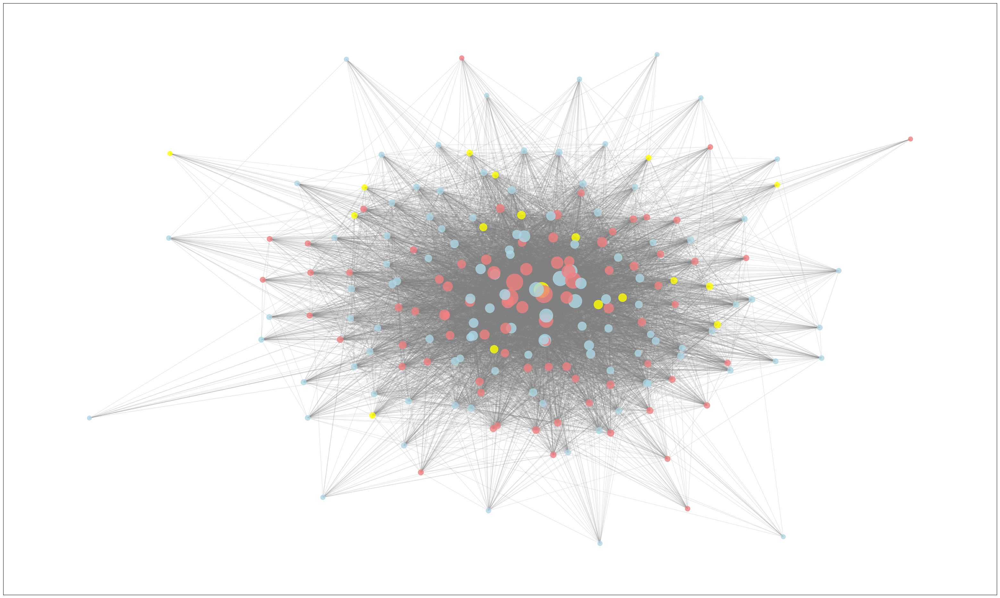

In [ ]:
pos_draw = drawGraph(G_draw,
                     pos=pos_draw,
                     node_size='in_degree', # size by # of mentions
                     # labels = dict([(u, G_draw.nodes[u]['label']) for u in G_draw.nodes()]), # uncomment to see MP names
                     node_color=[gov_colors[e['group']] for _,e in G.nodes(data=True)])

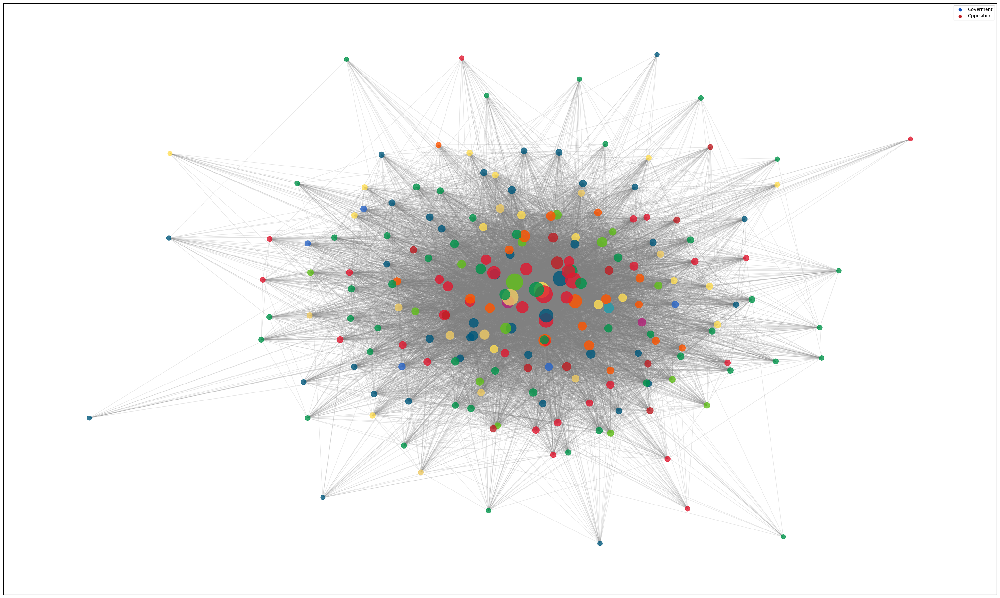

In [ ]:
node_colors = np.array([e.get('color') for _,e in G.nodes(data=True)])
#node_colors = np.array([gov_c if d['group'] in goverment else opp_c for n,d in G.nodes(data=True)])
all_labels = dict([(u, e.get('label')) for u,e in G.nodes(data=True)])
pos_draw = drawGraph(G_draw,
                     pos=pos_draw,
                     node_size='in_degree', # size by # of mentions
                     #labels = all_labels,
                     node_color=node_colors,
                     font_size=10,
                     gov_legend=True)



# Normalized edge weigths

In [ ]:
# Normalized edge weights

for link in list(G.edges(data=True)):
  # Proportion of mentions from mentioning party
  link[2]['out_norm'] =  link[2]['weight'] / G.nodes[link[0]]['out_degree']
  # Proportion of mentions to mentioned party
  link[2]['in_norm'] = link[2]['weight'] / G.nodes[link[1]]['in_degree']
  # Consider both directions
  link[2]['bi_norm'] = np.sqrt(link[2]['out_norm']*link[2]['in_norm'])


print('Samples of links:')
for e in list(G.edges(data=True))[:10]:
  print(e)


Samples of links:
('http://ldf.fi/semparl/people/p917', 'http://ldf.fi/semparl/people/p499', {'weight': 4, 'out_norm': 0.006745362563237774, 'in_norm': 0.012861736334405145, 'bi_norm': 0.009314347790818824})
('http://ldf.fi/semparl/people/p917', 'http://ldf.fi/semparl/people/p214', {'weight': 1, 'out_norm': 0.0016863406408094434, 'in_norm': 0.011904761904761904, 'bi_norm': 0.004480567354605892})
('http://ldf.fi/semparl/people/p917', 'http://ldf.fi/semparl/people/p212', {'weight': 2, 'out_norm': 0.003372681281618887, 'in_norm': 0.014084507042253521, 'bi_norm': 0.006892209606667359})
('http://ldf.fi/semparl/people/p917', 'http://ldf.fi/semparl/people/p592', {'weight': 7, 'out_norm': 0.011804384485666104, 'in_norm': 0.07, 'bi_norm': 0.028745554682361365})
('http://ldf.fi/semparl/people/p917', 'http://ldf.fi/semparl/people/p1091', {'weight': 1, 'out_norm': 0.0016863406408094434, 'in_norm': 0.020833333333333332, 'bi_norm': 0.005927233476380871})
('http://ldf.fi/semparl/people/p917', 'http:/

# Statistics

## References from MP

In [ ]:
print("MPs that have made the largest number mentions to other MPs:")
arr1 = sorted(dct1, key=lambda x: x[-1], reverse=True)
i = 1
for v,u in arr1[:10]:
  print(i, u, G.nodes[v])
  i += 1

MPs that have made the largest number mentions to other MPs:
1 1181 {'group': 'http://ldf.fi/semparl/groups/Q499029', 'id': 'http://ldf.fi/semparl/people/p511', 'label': 'Viitanen, Pia (1967-)', 'date': datetime.date(1995, 3, 24), 'committees': ['Tarkastusvaliokunta', 'Valtiovarainvaliokunta'], 'color': '#E11931', 'out_degree': 1181, 'in_degree': 579, 'speeches': 1051}
2 1045 {'group': 'http://ldf.fi/semparl/groups/Q304191', 'id': 'http://ldf.fi/semparl/people/p967', 'label': 'Heinonen, Timo (1975-)', 'date': datetime.date(2007, 3, 21), 'committees': ['Puolustusvaliokunta', 'Valtiovarainvaliokunta'], 'color': '#00587C', 'out_degree': 1045, 'in_degree': 799, 'speeches': 929}
3 961 {'group': 'http://ldf.fi/semparl/groups/Q304191', 'id': 'http://ldf.fi/semparl/people/p301', 'label': 'Zyskowicz, Ben (1954-)', 'date': datetime.date(1979, 3, 24), 'committees': ['Ulkoasiainvaliokunta'], 'color': '#00587C', 'out_degree': 961, 'in_degree': 996, 'speeches': 690}
4 843 {'group': 'http://ldf.fi/se

129.0

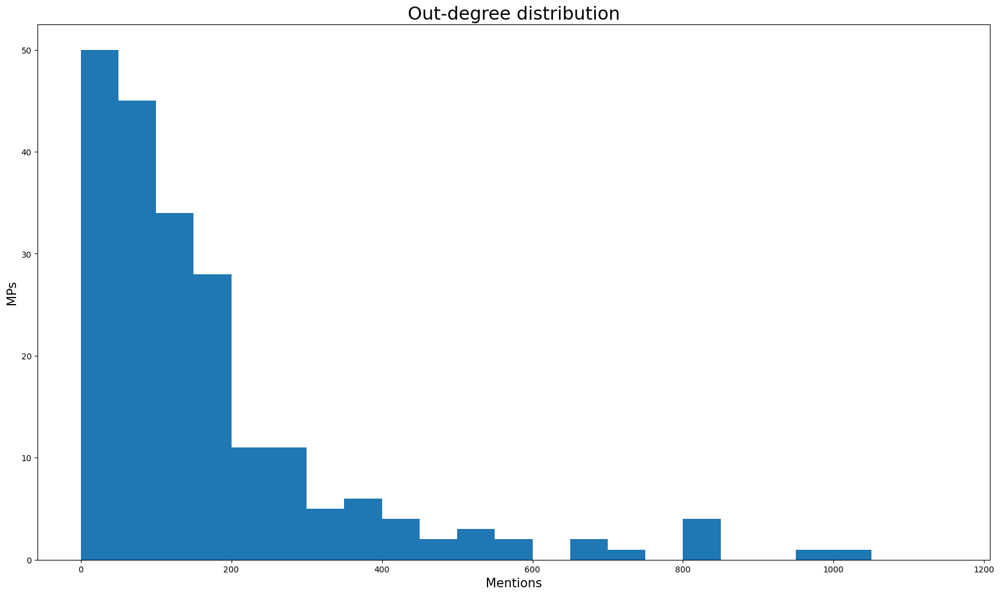

In [ ]:
fig = plt.figure(figsize=[16.0, 9.0])
ax = fig.add_axes([0,0,1,1])
n, bins, patches = ax.hist([u for _,u in arr1 ], bins=np.arange(0,1200,50))
ax.set_title("Out-degree distribution", fontdict={'fontsize':22})
ax.set_xlabel('Mentions', fontdict={'fontsize':15})
ax.set_ylabel('MPs', fontdict={'fontsize':15})
np.sum(n[:3])

In [ ]:
print("MPs that have mentioned the largest number of other MPs:")
dct1 = G.out_degree()
#set_stats_and_ranks(G, dct1, 'out_degree')
arr = sorted(dct1, key=lambda x: x[-1], reverse=True)
for v,u in arr[:10]:
  print('{:3d} {:.2f}'.format(u, G.nodes[v]['out_degree']/u), G.nodes[v])

MPs that have mentioned the largest number of other MPs:
173 6.04 {'group': 'http://ldf.fi/semparl/groups/Q304191', 'id': 'http://ldf.fi/semparl/people/p967', 'label': 'Heinonen, Timo (1975-)', 'date': datetime.date(2007, 3, 21), 'committees': ['Puolustusvaliokunta', 'Valtiovarainvaliokunta'], 'color': '#00587C', 'out_degree': 1045, 'in_degree': 799, 'speeches': 929}
168 5.02 {'group': 'http://ldf.fi/semparl/groups/Q385927', 'id': 'http://ldf.fi/semparl/people/p1154', 'label': 'Myllykoski, Jari (1959-)', 'date': datetime.date(2011, 4, 20), 'committees': ['Liikenne- ja viestintävaliokunta', 'Maa- ja metsätalousvaliokunta'], 'color': '#BF1E24', 'out_degree': 843, 'in_degree': 384, 'speeches': 759}
147 3.68 {'group': 'http://ldf.fi/semparl/groups/Q30337076', 'id': 'http://ldf.fi/semparl/people/p1146', 'label': 'Lindström, Jari (1965-)', 'date': datetime.date(2015, 5, 29), 'color': '#FF5500', 'out_degree': 541, 'in_degree': 906, 'committees': [], 'speeches': 529}
146 5.69 {'group': 'http:/

## References to MP

In [ ]:
print("MPs that have been mentioned the largest number of times:")
arr = sorted(dct_in, key=lambda x: x[-1], reverse=True)
top_mentioned = []
for v,u in arr[:10]:
  print(u, G.nodes[v])
  top_mentioned.append(v)

MPs that have been mentioned the largest number of times:
2131 {'group': 'http://ldf.fi/semparl/groups/Q506591', 'id': 'http://ldf.fi/semparl/people/p1108', 'label': 'Sipilä, Juha (1961-)', 'date': datetime.date(2011, 4, 20), 'color': '#01954B', 'out_degree': 406, 'in_degree': 1725, 'committees': [], 'speeches': 672}
1955 {'group': 'http://ldf.fi/semparl/groups/Q304191', 'id': 'http://ldf.fi/semparl/people/p301', 'label': 'Zyskowicz, Ben (1954-)', 'date': datetime.date(1979, 3, 24), 'committees': ['Ulkoasiainvaliokunta'], 'color': '#00587C', 'out_degree': 961, 'in_degree': 996, 'speeches': 690}
1842 {'group': 'http://ldf.fi/semparl/groups/Q304191', 'id': 'http://ldf.fi/semparl/people/p967', 'label': 'Heinonen, Timo (1975-)', 'date': datetime.date(2007, 3, 21), 'committees': ['Puolustusvaliokunta', 'Valtiovarainvaliokunta'], 'color': '#00587C', 'out_degree': 1045, 'in_degree': 799, 'speeches': 929}
1760 {'group': 'http://ldf.fi/semparl/groups/Q499029', 'id': 'http://ldf.fi/semparl/peopl

Text(0, 0.5, 'MPs')

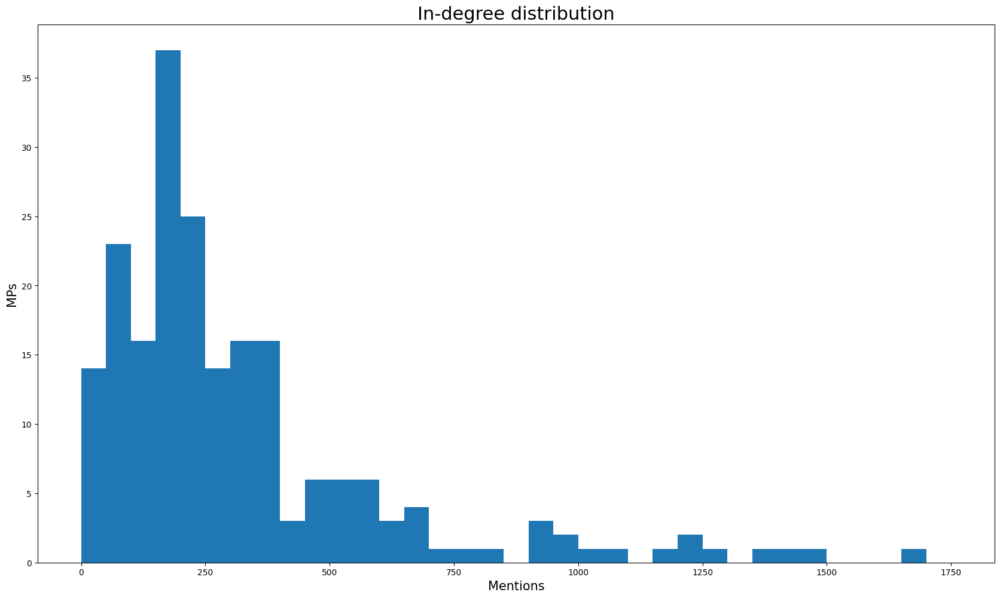

In [ ]:
fig = plt.figure(figsize=[16.0, 9.0])
ax = fig.add_axes([0,0,1,1])
n, bins, patches = ax.hist([u for _,u in arr ], bins=np.arange(0,1800,50))
ax.set_title("In-degree distribution",fontdict={'fontsize':22})
ax.set_xlabel('Mentions', fontdict={'fontsize':15})
ax.set_ylabel('MPs', fontdict={'fontsize':15})

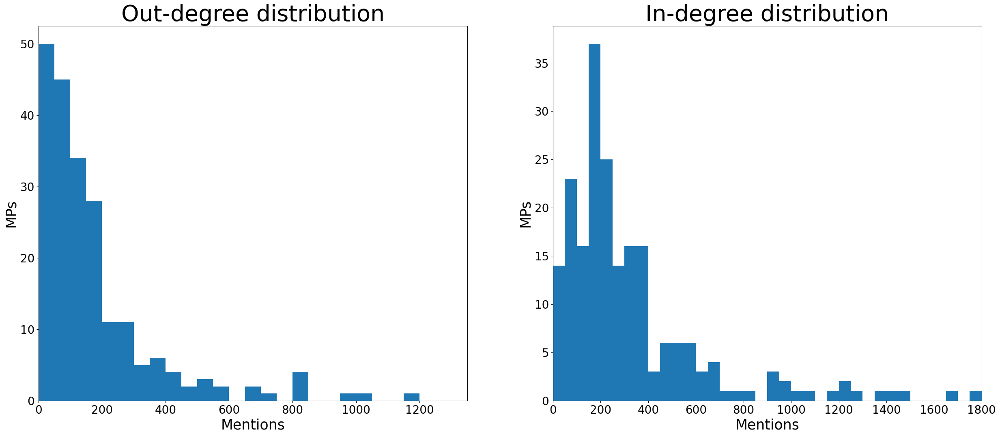

In [ ]:
fig = plt.figure(figsize=[30.0, 12.0])
ax1 = fig.add_subplot(1,2,1)
values1 = [u for _,u in arr1 ]
n, bins, patches = ax1.hist(values1, bins=np.arange(0,1400,50))
ax1.set_title("Out-degree distribution",fontdict={'fontsize':40})
ax1.set_xlabel('Mentions', fontdict={'fontsize':25})
ax1.set_ylabel('MPs', fontdict={'fontsize':25})
ax1.tick_params(axis='both', which='major', labelsize=20)
ax1.autoscale(enable=True, axis='x', tight=True)

ax2 = fig.add_subplot(1,2,2)
values2 = [u for _,u in arr ]
n, bins, patches = ax2.hist(values2, bins=np.arange(0,1850,50))
ax2.set_title("In-degree distribution",fontdict={'fontsize':40})
ax2.set_xlabel('Mentions', fontdict={'fontsize':25})
ax2.set_ylabel('MPs', fontdict={'fontsize':25})
ax2.tick_params(axis='both', which='major', labelsize=20)
ax2.autoscale(enable=True, axis='x', tight=True)


In [ ]:
print("Out:",np.quantile([u for _,u in arr1], 0.75))
print("In:",np.quantile([u for _,u in arr], 0.75))

Out: 209.5
In: 394.0


In [ ]:
print('MPs mentioned by the largest number of other MPs:')
dct_in = G.in_degree()
#set_stats_and_ranks(G, dct_in, 'in_degree')
arr = sorted(dct_in, key=lambda x: x[-1], reverse=True)
for v,u in arr[:15]:
  print('{:3d} {:.2f}'.format(u, G.nodes[v]['in_degree']/u), G.nodes[v])

MPs mentioned by the largest number of other MPs:
177 9.75 {'group': 'http://ldf.fi/semparl/groups/Q506591', 'id': 'http://ldf.fi/semparl/people/p1108', 'label': 'Sipilä, Juha (1961-)', 'date': datetime.date(2011, 4, 20), 'color': '#01954B', 'out_degree': 406, 'in_degree': 1725, 'committees': [], 'speeches': 672}
156 8.29 {'group': 'http://ldf.fi/semparl/groups/Q304191', 'id': 'http://ldf.fi/semparl/people/p947', 'label': 'Orpo, Petteri (1969-)', 'date': datetime.date(2007, 3, 21), 'color': '#00587C', 'out_degree': 363, 'in_degree': 1293, 'committees': [], 'speeches': 619}
150 6.04 {'group': 'http://ldf.fi/semparl/groups/Q30337076', 'id': 'http://ldf.fi/semparl/people/p1146', 'label': 'Lindström, Jari (1965-)', 'date': datetime.date(2015, 5, 29), 'color': '#FF5500', 'out_degree': 541, 'in_degree': 906, 'committees': [], 'speeches': 529}
150 5.33 {'group': 'http://ldf.fi/semparl/groups/Q304191', 'id': 'http://ldf.fi/semparl/people/p967', 'label': 'Heinonen, Timo (1975-)', 'date': dateti

## Density of network


In [ ]:
nx.density(G)

0.2967501692620176

## Pagerank

In [ ]:
dct = nx.pagerank(G)
set_stats_and_ranks(G, dct.items(), 'pagerank')

arr = arr = sorted(dct.items(), key=lambda x: x[-1], reverse=True)
i = 1
for v,u in arr[:30]:
  print(i, u, G.nodes[v])
  i += 1

1 0.03836787126432681 {'group': 'http://ldf.fi/semparl/groups/Q506591', 'id': 'http://ldf.fi/semparl/people/p1108', 'label': 'Sipilä, Juha (1961-)', 'date': datetime.date(2011, 4, 20), 'color': '#01954B', 'out_degree': 406, 'in_degree': 1725, 'committees': [], 'speeches': 672, 'pagerank': 0.03836787126432681}
2 0.028220689627552017 {'group': 'http://ldf.fi/semparl/groups/Q304191', 'id': 'http://ldf.fi/semparl/people/p947', 'label': 'Orpo, Petteri (1969-)', 'date': datetime.date(2007, 3, 21), 'color': '#00587C', 'out_degree': 363, 'in_degree': 1293, 'committees': [], 'speeches': 619, 'pagerank': 0.028220689627552017}
3 0.022005127387602946 {'group': 'http://ldf.fi/semparl/groups/Q499029', 'id': 'http://ldf.fi/semparl/people/p1274', 'label': 'Rinne, Antti (1962-)', 'date': datetime.date(2014, 6, 6), 'committees': ['Ulkoasiainvaliokunta'], 'color': '#E11931', 'out_degree': 454, 'in_degree': 732, 'speeches': 492, 'pagerank': 0.022005127387602946}
4 0.0212541638010735 {'group': 'http://ldf.

## Clustering

In [ ]:
dct = nx.clustering(G, weight='weight')
set_stats_and_ranks(G, dct.items(), 'clustering')

arr = sorted(dct.items(), key=lambda x: x[-1], reverse=True)
for v,u in arr[:15]:
  print(u, G.nodes[v])

0.0175273645537277 {'group': 'http://ldf.fi/semparl/groups/Q304191', 'id': 'http://ldf.fi/semparl/people/p301', 'label': 'Zyskowicz, Ben (1954-)', 'date': datetime.date(1979, 3, 24), 'committees': ['Ulkoasiainvaliokunta'], 'color': '#00587C', 'out_degree': 961, 'in_degree': 996, 'speeches': 690, 'pagerank': 0.020852610034614867, 'clustering': 0.0175273645537277}
0.01705542855695696 {'group': 'http://ldf.fi/semparl/groups/Q499029', 'id': 'http://ldf.fi/semparl/people/p1274', 'label': 'Rinne, Antti (1962-)', 'date': datetime.date(2014, 6, 6), 'committees': ['Ulkoasiainvaliokunta'], 'color': '#E11931', 'out_degree': 454, 'in_degree': 732, 'speeches': 492, 'pagerank': 0.022005127387602946, 'clustering': 0.01705542855695696}
0.016639331425994792 {'group': 'http://ldf.fi/semparl/groups/Q499029', 'id': 'http://ldf.fi/semparl/people/p511', 'label': 'Viitanen, Pia (1967-)', 'date': datetime.date(1995, 3, 24), 'committees': ['Tarkastusvaliokunta', 'Valtiovarainvaliokunta'], 'color': '#E11931', '

## Betweenness

In [ ]:
dct = nx.betweenness_centrality(G, weight='weight')
set_stats_and_ranks(G, dct.items(), 'betweenness')

arr =sorted(dct.items(), key=lambda x: x[-1], reverse=True)
for v,u in arr[:15]:
  print(u, G.nodes[v])

0.013385893210099663 {'group': 'http://ldf.fi/semparl/groups/Q1138982', 'id': 'http://ldf.fi/semparl/people/p778', 'label': 'Essayah, Sari (1967-)', 'date': datetime.date(2003, 3, 19), 'committees': ['Suuri valiokunta'], 'color': '#2B67C9', 'out_degree': 433, 'in_degree': 262, 'speeches': 652, 'pagerank': 0.007093174305139353, 'clustering': 0.010246029734910692, 'betweenness': 0.013385893210099663}
0.013112522758229876 {'group': 'http://ldf.fi/semparl/groups/Q506591', 'id': 'http://ldf.fi/semparl/people/p1313', 'label': 'Berner, Anne (1964-)', 'date': datetime.date(2015, 4, 22), 'color': '#01954B', 'out_degree': 130, 'in_degree': 425, 'committees': [], 'speeches': 252, 'pagerank': 0.009673388822705574, 'clustering': 0.008702798963109578, 'betweenness': 0.013112522758229876}
0.010896568481638853 {'group': 'http://ldf.fi/semparl/groups/Q1138982', 'id': 'http://ldf.fi/semparl/people/p499', 'label': 'Räsänen, Päivi (1959-)', 'date': datetime.date(1995, 3, 24), 'committees': ['Tarkastusvali

## Closeness

In [ ]:
dct = nx.closeness_centrality(G)
set_stats_and_ranks(G, dct.items(), 'clustering')

arr = sorted(dct.items(), key=lambda x: x[-1], reverse=True)
for v,u in arr[:15]:
  print(u, G.nodes[v])

0.8641975308641975 {'group': 'http://ldf.fi/semparl/groups/Q506591', 'id': 'http://ldf.fi/semparl/people/p1108', 'label': 'Sipilä, Juha (1961-)', 'date': datetime.date(2011, 4, 20), 'color': '#01954B', 'out_degree': 406, 'in_degree': 1725, 'committees': [], 'speeches': 672, 'pagerank': 0.03836787126432681, 'clustering': 0.8641975308641975, 'betweenness': 0.009196714130013897}
0.7954545454545454 {'group': 'http://ldf.fi/semparl/groups/Q304191', 'id': 'http://ldf.fi/semparl/people/p947', 'label': 'Orpo, Petteri (1969-)', 'date': datetime.date(2007, 3, 21), 'color': '#00587C', 'out_degree': 363, 'in_degree': 1293, 'committees': [], 'speeches': 619, 'pagerank': 0.028220689627552017, 'clustering': 0.7954545454545454, 'betweenness': 0.006615399861081934}
0.7777777777777778 {'group': 'http://ldf.fi/semparl/groups/Q30337076', 'id': 'http://ldf.fi/semparl/people/p1146', 'label': 'Lindström, Jari (1965-)', 'date': datetime.date(2015, 5, 29), 'color': '#FF5500', 'out_degree': 541, 'in_degree': 90

## Core number

In [ ]:
dct = nx.core_number(G)
set_stats_and_ranks(G, dct.items(), 'core_number')

arr = sorted(dct.items(), key=lambda x: x[-1], reverse=True)
for v,u in arr[:15]:
  print(u, G.nodes[v])


85 {'group': 'http://ldf.fi/semparl/groups/Q385927', 'id': 'http://ldf.fi/semparl/people/p917', 'label': 'Arhinmäki, Paavo (1976-)', 'date': datetime.date(2007, 3, 21), 'committees': ['Suuri valiokunta', 'Ulkoasiainvaliokunta'], 'color': '#BF1E24', 'out_degree': 593, 'in_degree': 371, 'speeches': 439, 'pagerank': 0.012241599642290109, 'clustering': 0.6481481481481481, 'betweenness': 0.005444584026775513, 'core_number': 85}
85 {'group': 'http://ldf.fi/semparl/groups/Q499029', 'id': 'http://ldf.fi/semparl/people/p1147', 'label': 'Lindtman, Antti (1982-)', 'date': datetime.date(2011, 4, 20), 'committees': ['Tulevaisuusvaliokunta'], 'color': '#E11931', 'out_degree': 821, 'in_degree': 384, 'speeches': 603, 'pagerank': 0.010797679752798793, 'clustering': 0.65625, 'betweenness': 0.009716005117679697, 'core_number': 85}
85 {'group': 'http://ldf.fi/semparl/groups/Q506591', 'id': 'http://ldf.fi/semparl/people/p392', 'label': 'Ala-Nissilä, Olavi (1949-)', 'date': datetime.date(1991, 3, 22), 'comm

## eigenvector_centrality

In [ ]:
dct = nx.eigenvector_centrality(G, max_iter=500)
set_stats_and_ranks(G, dct.items(), 'eigenvector')

arr = sorted(dct.items(), key=lambda x: x[-1], reverse=True)
i = 1
for v,u in arr[:30]:
  print(i, u, G.nodes[v])
  i += 1

1 0.15290745783149157 {'group': 'http://ldf.fi/semparl/groups/Q506591', 'id': 'http://ldf.fi/semparl/people/p1108', 'label': 'Sipilä, Juha (1961-)', 'date': datetime.date(2011, 4, 20), 'color': '#01954B', 'out_degree': 406, 'in_degree': 1725, 'committees': [], 'speeches': 672, 'pagerank': 0.03836787126432681, 'clustering': 0.8641975308641975, 'betweenness': 0.009196714130013897, 'core_number': 85, 'eigenvector': 0.15290745783149157}
2 0.13900211696425335 {'group': 'http://ldf.fi/semparl/groups/Q30337076', 'id': 'http://ldf.fi/semparl/people/p1146', 'label': 'Lindström, Jari (1965-)', 'date': datetime.date(2015, 5, 29), 'color': '#FF5500', 'out_degree': 541, 'in_degree': 906, 'committees': [], 'speeches': 529, 'pagerank': 0.0212541638010735, 'clustering': 0.7777777777777778, 'betweenness': 0.007658885928872956, 'core_number': 85, 'eigenvector': 0.13900211696425335}
3 0.13766288163529594 {'group': 'http://ldf.fi/semparl/groups/Q304191', 'id': 'http://ldf.fi/semparl/people/p947', 'label':

## node_clique_number

In [ ]:
dct = nx.node_clique_number(G.to_undirected())
set_stats_and_ranks(G, dct.items(), 'clique_number')

arr = sorted(dct.items(), key=lambda x: x[-1], reverse=True)
for v,u in arr[:15]:
  print(u, G.nodes[v])

28 {'group': 'http://ldf.fi/semparl/groups/Q304191', 'id': 'http://ldf.fi/semparl/people/p1300', 'label': 'Mykkänen, Kai (1979-)', 'date': datetime.date(2015, 4, 22), 'committees': ['Suuri valiokunta', 'Ympäristövaliokunta'], 'color': '#00587C', 'out_degree': 315, 'in_degree': 226, 'speeches': 219, 'pagerank': 0.006514765375069646, 'clustering': 0.6344410876132931, 'betweenness': 0.008200025414796225, 'core_number': 85, 'eigenvector': 0.09085711066831757, 'clique_number': 28}
28 {'group': 'http://ldf.fi/semparl/groups/Q499029', 'id': 'http://ldf.fi/semparl/people/p768', 'label': 'Heinäluoma, Eero (1955-)', 'date': datetime.date(2003, 3, 19), 'committees': ['Suuri valiokunta', 'Tarkastusvaliokunta', 'Valtiovarainvaliokunta'], 'color': '#E11931', 'out_degree': 804, 'in_degree': 694, 'speeches': 727, 'pagerank': 0.017261330916258887, 'clustering': 0.711864406779661, 'betweenness': 0.0055817125134456835, 'core_number': 85, 'eigenvector': 0.12052170510830824, 'clique_number': 28}
28 {'group

## Central cliques

In [ ]:
cliques = False
if cliques: #slow
  for ob in nx.find_cliques(G.to_undirected()):
    if len(ob)>3:
      print(len(ob))
      for n in ob:
        print("\t", G.nodes[n]['label'])

## Communities

In [ ]:
c = nxcommunity.greedy_modularity_communities(G)
for i, group in enumerate(c):
  print("Group", i+1)
  for id in group:
    print("{:40s} {:30s}".format(G.nodes[id]['label'], group_names[G.nodes[id]['group']]))
  print()

Group 1
Kopra, Jukka (1967-)                     Kansallinen Kokoomus          
Lehti, Eero (1944-)                      Kansallinen Kokoomus          
Torniainen, Ari (1956-)                  Suomen Keskusta               
Nylander, Mikaela (1970-)                Suomen ruotsalainen kansanpuolue
Viitanen, Pia (1967-)                    Suomen Sosialidemokraattinen Puolue
Strand, Joakim (1982-)                   Suomen ruotsalainen kansanpuolue
Karimäki, Johanna (1973-)                Vihreä liitto                 
Mikkonen, Krista (1972-)                 Vihreä liitto                 
Suutari, Eero (1956-)                    Kansallinen Kokoomus          
Blomqvist, Thomas (1965-)                Suomen ruotsalainen kansanpuolue
Kosonen, Hanna (1976-)                   Suomen Keskusta               
Lintilä, Mika (1966-)                    Suomen Keskusta               
Rantakangas, Antti (1964-2019)           Suomen Keskusta               
Pakkanen, Markku (1960-)                 Suom

# Hubs and authorities

In [ ]:
h,a = nx.hits(G)

In [ ]:
arr1 = sorted(h.items(), key=lambda x: x[-1], reverse=True)
top_hubs = []
set_stats_and_ranks(G, h.items(), 'hub')
for v,u in arr1[:15]:
  print(u, G.nodes[v])
  top_hubs.append(v)

0.05008450021689405 {'group': 'http://ldf.fi/semparl/groups/Q499029', 'id': 'http://ldf.fi/semparl/people/p511', 'label': 'Viitanen, Pia (1967-)', 'date': datetime.date(1995, 3, 24), 'committees': ['Tarkastusvaliokunta', 'Valtiovarainvaliokunta'], 'color': '#E11931', 'out_degree': 1181, 'in_degree': 579, 'speeches': 1051, 'pagerank': 0.012762567252743346, 'clustering': 0.6796116504854369, 'betweenness': 0.009539735525750076, 'core_number': 85, 'eigenvector': 0.10721198856517257, 'clique_number': 28, 'hub': 0.05008450021689405}
0.0328582671819742 {'group': 'http://ldf.fi/semparl/groups/Q499029', 'id': 'http://ldf.fi/semparl/people/p1147', 'label': 'Lindtman, Antti (1982-)', 'date': datetime.date(2011, 4, 20), 'committees': ['Tulevaisuusvaliokunta'], 'color': '#E11931', 'out_degree': 821, 'in_degree': 384, 'speeches': 603, 'pagerank': 0.010797679752798793, 'clustering': 0.65625, 'betweenness': 0.009716005117679697, 'core_number': 85, 'eigenvector': 0.10130009598672517, 'clique_number': 2

In [ ]:
arr2 = sorted(a.items(), key=lambda x: x[-1], reverse=True)
top_auths = []
set_stats_and_ranks(G, a.items(), 'authority')
for v,u in arr2[:15]:
  print(u, G.nodes[v])
  top_auths.append(v)

0.05296766040784394 {'group': 'http://ldf.fi/semparl/groups/Q506591', 'id': 'http://ldf.fi/semparl/people/p1108', 'label': 'Sipilä, Juha (1961-)', 'date': datetime.date(2011, 4, 20), 'color': '#01954B', 'out_degree': 406, 'in_degree': 1725, 'committees': [], 'speeches': 672, 'pagerank': 0.03836787126432681, 'clustering': 0.8641975308641975, 'betweenness': 0.009196714130013897, 'core_number': 85, 'eigenvector': 0.15290745783149157, 'clique_number': 28, 'hub': 0.008460904954266261, 'authority': 0.05296766040784394}
0.05075678252779365 {'group': 'http://ldf.fi/semparl/groups/Q304191', 'id': 'http://ldf.fi/semparl/people/p947', 'label': 'Orpo, Petteri (1969-)', 'date': datetime.date(2007, 3, 21), 'color': '#00587C', 'out_degree': 363, 'in_degree': 1293, 'committees': [], 'speeches': 619, 'pagerank': 0.028220689627552017, 'clustering': 0.7954545454545454, 'betweenness': 0.006615399861081934, 'core_number': 85, 'eigenvector': 0.13766288163529594, 'clique_number': 28, 'hub': 0.009667878371523

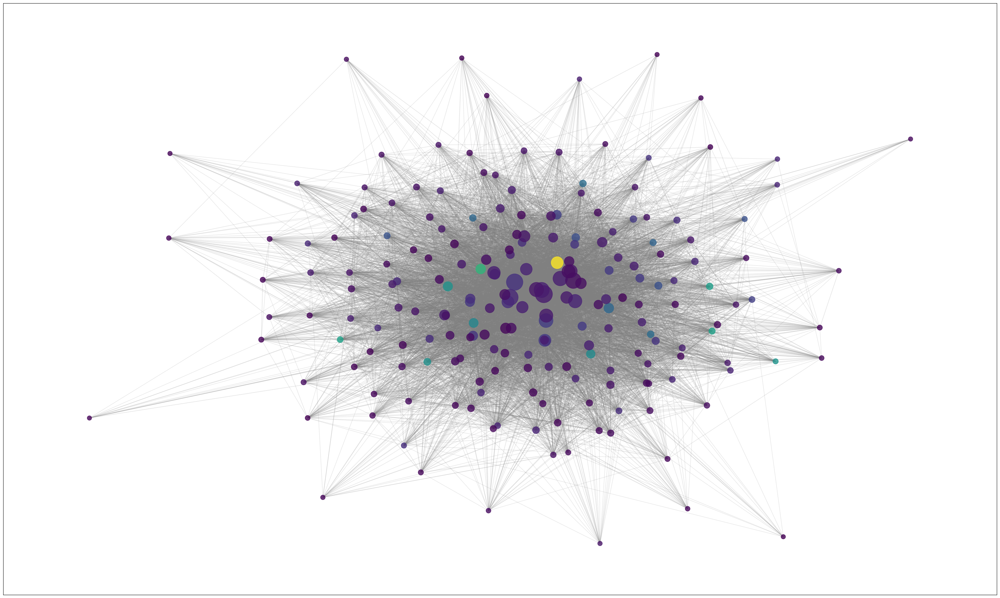

In [ ]:
pos_draw = drawGraph(G_draw,
                     pos=pos_draw,
                     node_size='in_degree', # size by # of mentions
                     # labels = dict([(u, G_draw.nodes[u]['label']) for u in G_draw.nodes()]), # uncomment to see MP names
                     node_color=[u for _,u in arr1])

In [ ]:
Gc = G.copy()
top_hubs = top_hubs[:10]
top_auths = top_auths[:10]
Gc.remove_nodes_from([n for n in Gc.nodes() if (n not in top_hubs and n not in top_auths)])
node_colors1 = []
node_colors2 = []
edge_colors = []
nodes1 = []
nodes2 = []
other = []

norm = colors.Normalize(vmin=0, vmax=0.06)
#norm = colors.Normalize(vmin=-0.055, vmax=0.055)
to_be_removed = []
for n,d in Gc.nodes(data=True):
  if (n in top_hubs and n in top_auths):
    node_colors2.append(colors.rgb2hex(cm.Blues(norm(d['hub']))))
    edge_colors.append(colors.rgb2hex(cm.Reds(norm(d['authority']))))
    nodes2.append(n)
  elif n in top_hubs:
    nodes1.append(n)
    node_colors1.append(colors.rgb2hex(cm.Blues(norm(d['hub']))))
  elif n in top_auths:
    nodes1.append(n)
    node_colors1.append(colors.rgb2hex(cm.Reds(norm(d['authority']))))


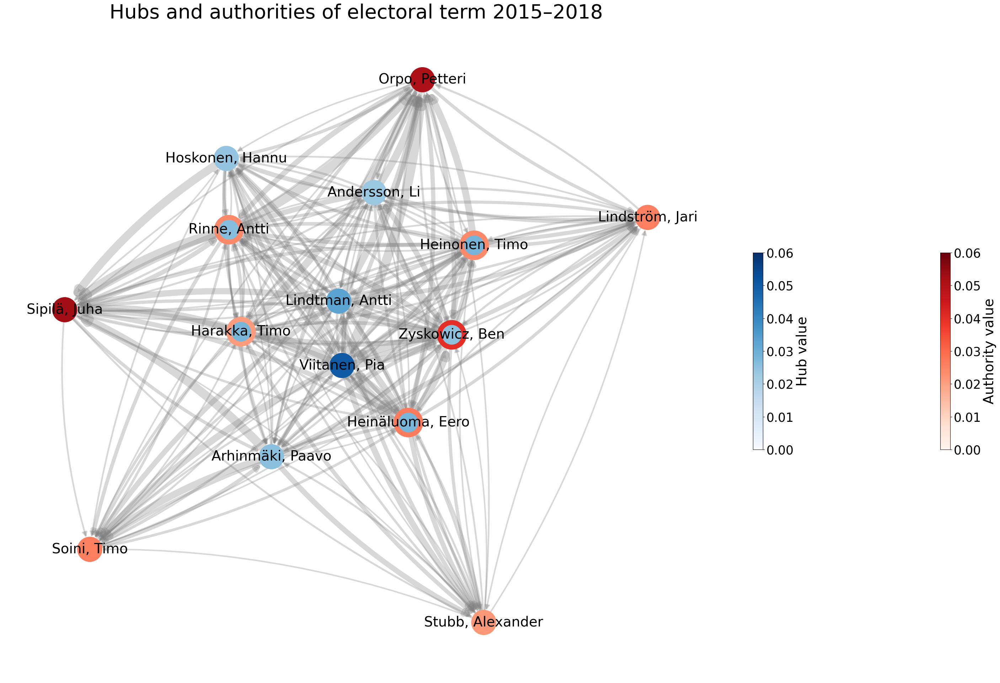

In [ ]:
pos = nx.drawing.layout.fruchterman_reingold_layout(Gc, iterations=200)

fig = plt.figure(figsize=[40.0, 24.0])
ax = fig.add_subplot(111)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

nodesize = 2500

edge_weights = [e.get('weight',1) for _,_,e in Gc.edges(data=True)]
scale_weight =  interp1d([min(edge_weights),max(edge_weights)],[3,23])
nx.drawing.draw_networkx_edges(Gc,
                              width=scale_weight(edge_weights),
                              pos=pos,
                              alpha=0.3,
                              edge_color='grey',
                              connectionstyle='arc3, rad = 0.1',
                              arrowsize=20,
                              node_size=nodesize
                              )



nx.drawing.draw_networkx_nodes(Gc,
                              pos=pos,
                              node_size=nodesize,
                              nodelist=nodes1,
                              node_color = node_colors1,
                              cmap = 'bwr'
                              )

nx.drawing.draw_networkx_nodes(Gc,
                              pos=pos,
                              node_size=nodesize,
                              nodelist=nodes2, # e.g. Zyskowicz, Aalto, both top hubs and authorities
                              node_color = node_colors2,
                              linewidths = 10,
                              edgecolors = edge_colors,
                              cmap = 'bwr'
                              )

nx.drawing.draw_networkx_labels(Gc,
                          pos=pos,
                          font_size = 28,
                          labels = dict([(n," ".join(d['label'].split(" ")[:-1])) if n not in other else (n,'') for n,d in list(Gc.nodes(data=True))]))

sm = plt.cm.ScalarMappable(cmap=cm.Reds, norm=norm)
sm._A = []
cba = plt.colorbar(sm, ax=ax, shrink=0.3)

sm = plt.cm.ScalarMappable(cmap=cm.Blues, norm=norm)
#sm = plt.cm.ScalarMappable(cmap=cm.Blues, norm=plt.Normalize(vmin = 0, vmax=0.3))
sm._A = []
cbb = plt.colorbar(sm, ax=ax, shrink=0.3)
#pa = ax.imshow(interpolation='nearest',cmap=cm.Reds)
#cba = plt.colorbar(shrink=0.5)
#pb = ax.imshow(fig, interpolation='nearest',cmap=cm.Blues)
#cbb = plt.colorbar(hub_vals,shrink=0.5)
cba.set_label('Authority value', size=28)
cbb.set_label('Hub value',size=28)

cba.ax.tick_params(labelsize=25)
cbb.ax.tick_params(labelsize=25)
plt.title('Hubs and authorities of electoral term 2015–2018',fontsize=40)
plt.show()

# Statistics to table

In [ ]:
keys = list(G.nodes[v].keys())
keys.remove('committees')
table = []
labels = []
for n,d in list(G.nodes(data=True)):

  if n in top_hubs or n in top_auths:
    row = []
    labels.append(d['label'])
    for key in keys:
      try:
        row.append(round(d[key],3))
      except TypeError:
        row.append(d[key])
      except KeyError:
        row.append(0)
    table.append(row)
print(table)
df = pd.DataFrame(np.array(table), columns=keys, index=labels).sort_values(by=['in_degree'], ascending=False)
df

[['http://ldf.fi/semparl/groups/Q385927', 'http://ldf.fi/semparl/people/p917', 'Arhinmäki, Paavo (1976-)', datetime.date(2007, 3, 21), '#BF1E24', 593, 371, 439, 0.012, 0.648, 0.005, 85, 0.098, 27, 0.025, 0.009], ['http://ldf.fi/semparl/groups/Q499029', 'http://ldf.fi/semparl/people/p1147', 'Lindtman, Antti (1982-)', datetime.date(2011, 4, 20), '#E11931', 821, 384, 603, 0.011, 0.656, 0.01, 85, 0.101, 27, 0.033, 0.013], ['http://ldf.fi/semparl/groups/Q30337076', 'http://ldf.fi/semparl/people/p1146', 'Lindström, Jari (1965-)', datetime.date(2015, 5, 29), '#FF5500', 541, 906, 529, 0.021, 0.778, 0.008, 85, 0.139, 28, 0.009, 0.026], ['http://ldf.fi/semparl/groups/Q385927', 'http://ldf.fi/semparl/people/p1310', 'Andersson, Li (1987-)', datetime.date(2015, 4, 22), '#BF1E24', 569, 369, 743, 0.01, 0.671, 0.008, 85, 0.106, 28, 0.023, 0.008], ['http://ldf.fi/semparl/groups/Q304191', 'http://ldf.fi/semparl/people/p967', 'Heinonen, Timo (1975-)', datetime.date(2007, 3, 21), '#00587C', 1045, 799, 929

,group,id,label,date,color,out_degree,in_degree,speeches,pagerank,clustering,betweenness,core_number,eigenvector,clique_number,hub,authority
"Sipilä, Juha (1961-)",http://ldf.fi/semparl/groups/Q506591,http://ldf.fi/semparl/people/p1108,"Sipilä, Juha (1961-)",2011-04-20,#01954B,406,1725,672,0.038,0.864,0.009,85,0.153,28,0.008,0.053
"Orpo, Petteri (1969-)",http://ldf.fi/semparl/groups/Q304191,http://ldf.fi/semparl/people/p947,"Orpo, Petteri (1969-)",2007-03-21,#00587C,363,1293,619,0.028,0.795,0.007,85,0.138,28,0.01,0.051
"Zyskowicz, Ben (1954-)",http://ldf.fi/semparl/groups/Q304191,http://ldf.fi/semparl/people/p301,"Zyskowicz, Ben (1954-)",1979-03-24,#00587C,961,996,690,0.021,0.737,0.007,85,0.128,28,0.025,0.04
"Lindström, Jari (1965-)",http://ldf.fi/semparl/groups/Q30337076,http://ldf.fi/semparl/people/p1146,"Lindström, Jari (1965-)",2015-05-29,#FF5500,541,906,529,0.021,0.778,0.008,85,0.139,28,0.009,0.026
"Heinonen, Timo (1975-)",http://ldf.fi/semparl/groups/Q304191,http://ldf.fi/semparl/people/p967,"Heinonen, Timo (1975-)",2007-03-21,#00587C,1045,799,929,0.017,0.778,0.009,85,0.137,28,0.028,0.024
"Soini, Timo (1962-)",http://ldf.fi/semparl/groups/Q30337076,http://ldf.fi/semparl/people/p767,"Soini, Timo (1962-)",2015-05-29,#FF5500,357,742,326,0.02,0.739,0.008,85,0.125,28,0.006,0.026
"Rinne, Antti (1962-)",http://ldf.fi/semparl/groups/Q499029,http://ldf.fi/semparl/people/p1274,"Rinne, Antti (1962-)",2014-06-06,#E11931,454,732,492,0.022,0.682,0.006,85,0.112,27,0.026,0.024
"Heinäluoma, Eero (1955-)",http://ldf.fi/semparl/groups/Q499029,http://ldf.fi/semparl/people/p768,"Heinäluoma, Eero (1955-)",2003-03-19,#E11931,804,694,727,0.017,0.712,0.006,85,0.121,28,0.028,0.027
"Viitanen, Pia (1967-)",http://ldf.fi/semparl/groups/Q499029,http://ldf.fi/semparl/people/p511,"Viitanen, Pia (1967-)",1995-03-24,#E11931,1181,579,1051,0.013,0.68,0.01,85,0.107,28,0.05,0.02
"Harakka, Timo (1962-)",http://ldf.fi/semparl/groups/Q499029,http://ldf.fi/semparl/people/p1326,"Harakka, Timo (1962-)",2015-04-22,#E11931,700,560,652,0.013,0.719,0.008,85,0.123,28,0.028,0.021


In [ ]:
print(df.to_latex(columns=['in_degree', 'out_degree', 'pagerank', 'eigenvector']))

\begin{tabular}{lllll}
\toprule
{} & in\_degree & out\_degree & pagerank & eigenvector \\
\midrule
Sipilä, Juha (1961-)     &      1725 &        406 &    0.038 &       0.153 \\
Orpo, Petteri (1969-)    &      1293 &        363 &    0.028 &       0.138 \\
Zyskowicz, Ben (1954-)   &       996 &        961 &    0.021 &       0.128 \\
Lindström, Jari (1965-)  &       906 &        541 &    0.021 &       0.139 \\
Heinonen, Timo (1975-)   &       799 &       1045 &    0.017 &       0.137 \\
Soini, Timo (1962-)      &       742 &        357 &     0.02 &       0.125 \\
Rinne, Antti (1962-)     &       732 &        454 &    0.022 &       0.112 \\
Heinäluoma, Eero (1955-) &       694 &        804 &    0.017 &       0.121 \\
Viitanen, Pia (1967-)    &       579 &       1181 &    0.013 &       0.107 \\
Harakka, Timo (1962-)    &       560 &        700 &    0.013 &       0.123 \\
Hoskonen, Hannu (1957-)  &       539 &        831 &    0.011 &       0.117 \\
Stubb, Alexander (1968-) &       467 &     

# Choose MPs with highest number of mentions


In [ ]:
mps = 30
dct3 = []

G2 = G.copy()

for n,d in list(G2.nodes(data=True)):
  dct3.append((n, d['in_degree']+d['out_degree']))
set_stats_and_ranks(G2, dct3, 'total_mentions')

top_mentions = []
top_names = []
top_colors = []

# Change dct parameter to choose MPs based on different measures
dct_in = G.in_degree(weight='weight')
arr = sorted(dct_in, key=lambda x: x[-1], reverse=True)

i = 0
while len(top_mentions) < mps and i < len(list(G.nodes)):
  v,u = arr[i] #for v,u in arr[:mps]:
  if G.nodes[v]['in_degree'] > 0:
    print(u, G.nodes[v])
    top_mentions.append(v)
    top_names.append(G.nodes[v]['label'])
    top_colors.append(G.nodes[v]['color'])

  i += 1

print(len(top_colors))

1725 {'group': 'http://ldf.fi/semparl/groups/Q506591', 'id': 'http://ldf.fi/semparl/people/p1108', 'label': 'Sipilä, Juha (1961-)', 'date': datetime.date(2011, 4, 20), 'color': '#01954B', 'out_degree': 406, 'in_degree': 1725, 'committees': [], 'speeches': 672, 'pagerank': 0.03836787126432681, 'clustering': 0.8641975308641975, 'betweenness': 0.009196714130013897, 'core_number': 85, 'eigenvector': 0.15290745783149157, 'clique_number': 28, 'hub': 0.008460904954266261, 'authority': 0.05296766040784394}
1293 {'group': 'http://ldf.fi/semparl/groups/Q304191', 'id': 'http://ldf.fi/semparl/people/p947', 'label': 'Orpo, Petteri (1969-)', 'date': datetime.date(2007, 3, 21), 'color': '#00587C', 'out_degree': 363, 'in_degree': 1293, 'committees': [], 'speeches': 619, 'pagerank': 0.028220689627552017, 'clustering': 0.7954545454545454, 'betweenness': 0.006615399861081934, 'core_number': 85, 'eigenvector': 0.13766288163529594, 'clique_number': 28, 'hub': 0.009667878371523735, 'authority': 0.0507567825

# MDS

In [ ]:
A = nx.adjacency_matrix(G, weight='weight')
A = np.asarray(A.todense())
pd.set_option('display.max_columns', 50)
df = pd.DataFrame(A, columns=all_labels.values(), index=all_labels.values())
df_top = df[top_names]
df_top = df_top.loc[(df_top.sum(axis=1) != 0)] # Remove MPs that do not mention anyone
A2 = df_top.to_numpy()
df_top

,"Sipilä, Juha (1961-)","Orpo, Petteri (1969-)","Zyskowicz, Ben (1954-)","Lindström, Jari (1965-)","Heinonen, Timo (1975-)","Soini, Timo (1962-)","Rinne, Antti (1962-)","Heinäluoma, Eero (1955-)","Viitanen, Pia (1967-)","Tiilikainen, Kimmo (1966-)","Harakka, Timo (1962-)","Hoskonen, Hannu (1957-)","Stubb, Alexander (1968-)","Saarikko, Annika (1983-)","Berner, Anne (1964-)","Kankaanniemi, Toimi (1950-)","Niinistö, Ville (1976-)","Lindtman, Antti (1982-)","Myllykoski, Jari (1959-)","Arhinmäki, Paavo (1976-)","Andersson, Li (1987-)","Ihalainen, Lauri (1947-)","Rehula, Juha (1963-)","Räsänen, Päivi (1959-)","Meri, Leena (1968-)","Aalto, Touko (1984-)","Gustafsson, Jukka (1947-)","Kiuru, Krista (1974-)","Hassi, Satu (1951-)","Laukkanen, Antero (1958-)"
"Arhinmäki, Paavo (1976-)",79,27,33,26,8,58,1,1,0,1,1,4,41,4,8,6,6,0,1,0,3,4,4,4,1,0,0,0,0,2
"Paloniemi, Aila (1956-)",3,0,1,0,2,3,0,0,1,3,1,0,0,1,1,0,1,0,2,1,3,0,2,2,1,1,2,1,0,0
"Lindtman, Antti (1982-)",51,62,66,32,26,40,28,6,12,3,7,15,28,19,4,14,3,0,1,1,0,16,12,4,6,0,3,3,1,0
"Ala-Nissilä, Olavi (1949-)",24,17,15,4,6,2,10,22,16,13,18,9,7,4,6,11,3,3,2,4,9,5,0,0,0,1,4,4,0,2
"Kankaanniemi, Toimi (1950-)",26,15,5,23,2,8,48,37,26,0,12,8,2,2,4,0,3,2,3,1,1,9,7,1,4,17,7,12,1,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Modig, Silvia (1976-)",7,9,0,3,5,4,0,2,0,12,0,9,1,2,1,2,0,0,2,1,3,1,0,1,0,0,0,0,12,4
"Ihalainen, Lauri (1947-)",1,1,1,2,0,0,1,4,3,0,2,3,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
"Mattila, Hanna-Leena (1968-)",1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
"Tiilikainen, Kimmo (1966-)",11,0,0,0,15,1,2,7,8,0,2,9,1,1,5,1,15,3,11,3,1,0,1,0,3,10,0,2,14,1


In [ ]:
np.sum(df_top.sum(axis=1) == 0)

0

In [ ]:
np.sum(df_top.sum(axis=0) == 0)

0

In [ ]:
from sklearn.manifold import MDS
from sklearn.metrics import pairwise

In [ ]:
correlations = np.corrcoef(A2,rowvar=False)

embedding = MDS(n_components=2, metric=True)#, dissimilarity='precomputed')
C_transformed = embedding.fit_transform(correlations)
print("Stress:", embedding.stress_)

d = pairwise.euclidean_distances(embedding.embedding_)
print(0.5*np.sum((d-embedding.dissimilarity_matrix_)**2))

## Kruskal's stress
stress1 = np.sqrt(embedding.stress_ / (0.5 * np.sum(embedding.dissimilarity_matrix_**2)))
print("Kruskal's Stress :", stress1)


Stress: 34.44106202797716
34.42113623803573
Kruskal's Stress : 0.17324984112244915


In [ ]:
R = np.corrcoef(pairwise.euclidean_distances(embedding.embedding_).flatten(), embedding.dissimilarity_matrix_.flatten())[0,1]
print("R-squared", R*R)

R-squared 0.9001937525064717


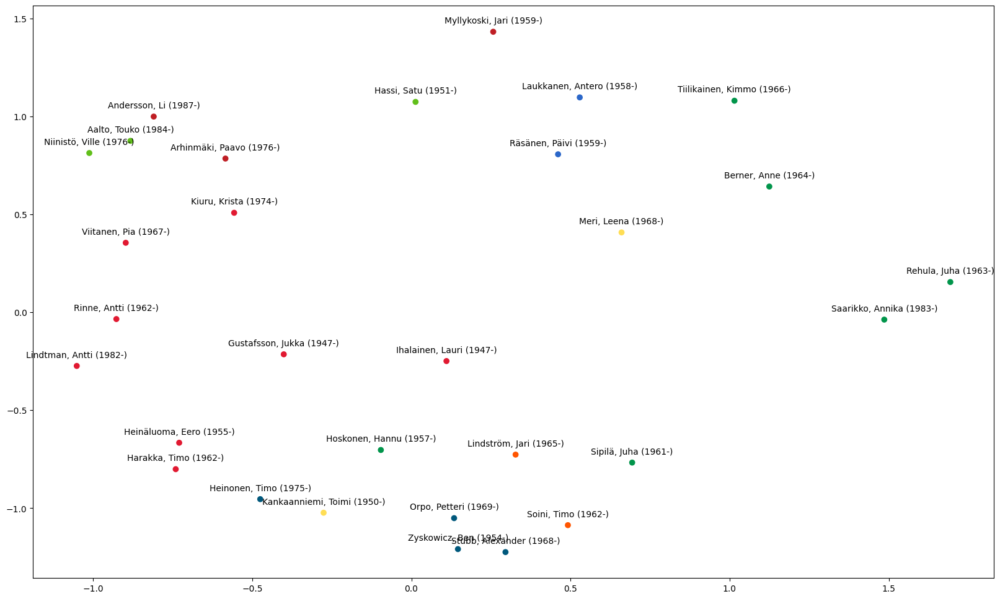

In [ ]:
fig = plt.figure(figsize=[20.0, 12.0])
ax = fig.add_subplot(111)


ax.scatter(C_transformed[:,0], C_transformed[:,1], c=top_colors)


for x,y,i in zip(C_transformed[:,0], C_transformed[:,1], range(C_transformed.shape[0])):
    ax.annotate(top_names[i],
                 (x,y),
                 textcoords="offset points",
                 xytext=(0,10),
                 ha='center')



In [ ]:
def belongs_to_committee(committee, v, G):
  if committee in G.nodes[v]['committees']:
    return True
  if committee == "No committee" and len(G.nodes[v]['committees'])==0:
    return True
  return False

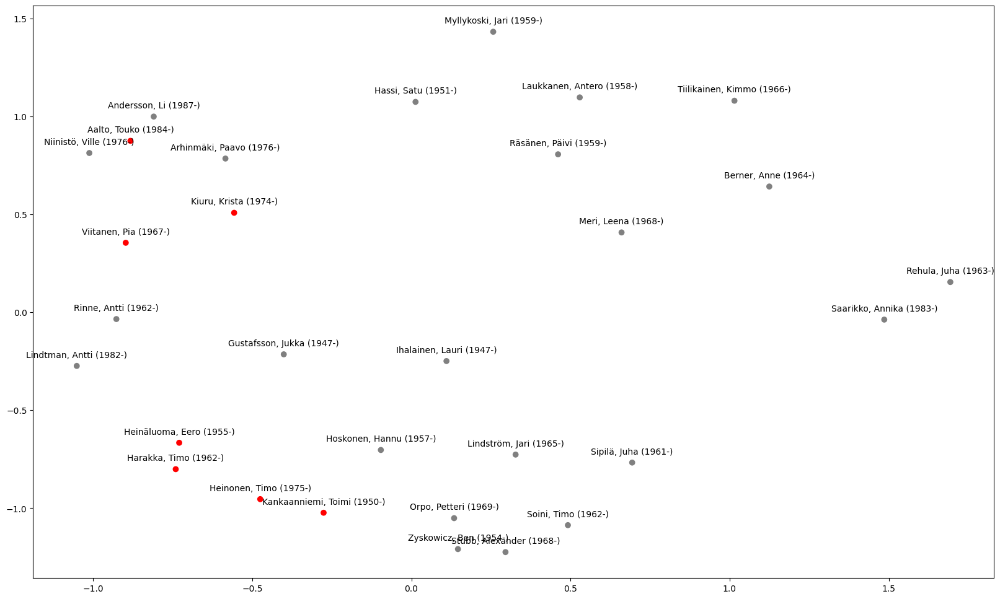

In [ ]:
# Color MPs that have belonged to chose committee
fig = plt.figure(figsize=[20.0, 12.0])
ax = fig.add_subplot(111)

committee = 'Valtiovarainvaliokunta'
colors = ["red" if belongs_to_committee(committee,n,G) else "grey" for n in top_mentions]
ax.scatter(C_transformed[:,0], C_transformed[:,1], c=colors)


for x,y,i in zip(C_transformed[:,0], C_transformed[:,1], range(C_transformed.shape[0])):
    ax.annotate(top_names[i], # this is the text
                 (x,y), # these are the coordinates to position the label
                 textcoords="offset points", # how to position the text
                 xytext=(0,10), # distance from text to points (x,y)
                 ha='center') # horizontal alignment can be left, right or center



# Clustering

In [ ]:
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.preprocessing import StandardScaler

In [ ]:
correlations = C_norm
k = 3

In [ ]:
kmeans = KMeans(n_clusters=k).fit(correlations)
clabels = kmeans.labels_

In [ ]:
committees_total = {x: 0 for x in committee_names}
committees_total['No committee'] = 0
persons = np.array(G.nodes(data=True))
for i in range(k):
  print("Group", i+1)
  for person in np.array(top_mentions)[clabels==i]:
    data = G.nodes[person]
    plabel = data['label'].split(" ")
    plabel = plabel[0] + plabel[1][0] + "."
    print("{:30s} {:10s} {:<40s} {:<100s}".format(plabel, '', group_names[data['group']], ", ".join(data['committees'])))
    if len(data['committees']) == 0:
      committees_total['No committee'] += 1
    else:
      for c in data['committees']:
        committees_total[c] += 1
  print()


Group 1
Niinistö,V.                               Vihreä liitto                            Perustuslakivaliokunta, Suuri valiokunta                                                            
Lindtman,A.                               Suomen Sosialidemokraattinen Puolue      Tulevaisuusvaliokunta                                                                               
Arhinmäki,P.                              Vasemmistoliitto                         Suuri valiokunta, Ulkoasiainvaliokunta                                                              
Andersson,L.                              Vasemmistoliitto                         Sivistysvaliokunta                                                                                  
Aalto,T.                                  Vihreä liitto                            Suuri valiokunta, Valtiovarainvaliokunta                                                            
Kiuru,K.                                  Suomen Sosialidemokraattinen P

In [ ]:
clustering = AgglomerativeClustering(n_clusters=k).fit(correlations)
clabels = clustering.labels_

In [ ]:
persons = np.array(G.nodes(data=True))
for i in range(k):
  print("Group", i+1)
  for person in np.array(top_mentions)[clabels==i]:
    data = G.nodes[person]
    plabel = data['label'].split(" ")
    plabel = plabel[0] + " " + plabel[1][0] + "."
    print("{:30s} {:10s} {:<40s} {:<100s}".format(plabel, '', group_names[data['group']], ", ".join(data['committees'])))
  print()



Group 1
Rinne, A.                                 Suomen Sosialidemokraattinen Puolue      Ulkoasiainvaliokunta                                                                                
Heinäluoma, E.                            Suomen Sosialidemokraattinen Puolue      Suuri valiokunta, Tarkastusvaliokunta, Valtiovarainvaliokunta                                       
Viitanen, P.                              Suomen Sosialidemokraattinen Puolue      Tarkastusvaliokunta, Valtiovarainvaliokunta                                                         
Harakka, T.                               Suomen Sosialidemokraattinen Puolue      Suuri valiokunta, Valtiovarainvaliokunta                                                            
Myllykoski, J.                            Vasemmistoliitto                         Liikenne- ja viestintävaliokunta, Maa- ja metsätalousvaliokunta                                     
Ihalainen, L.                             Suomen Sosialidemokraattinen P

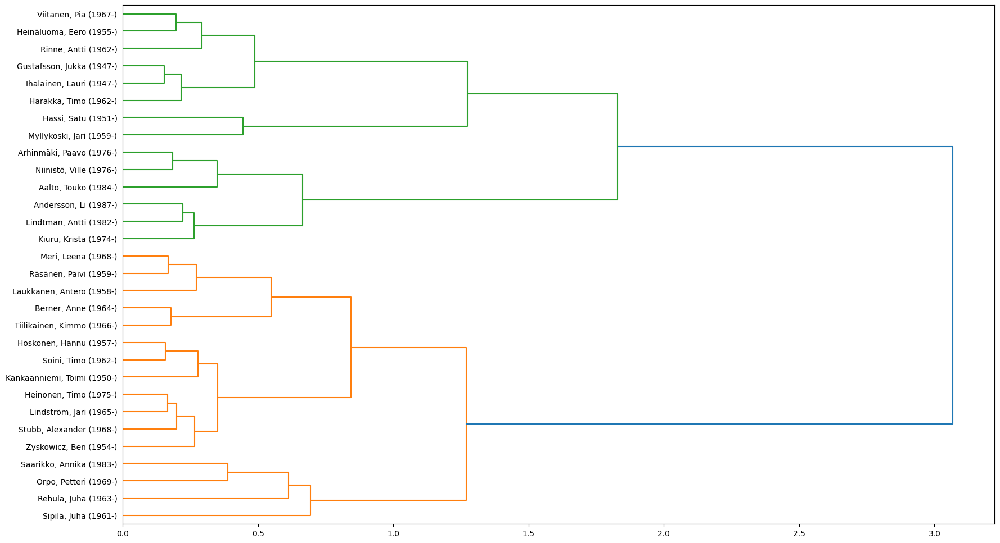

In [ ]:
hlabels = [G.nodes[person]['label'] for person in top_mentions]
Z = linkage(correlations, 'ward')

plt.figure(figsize=[20.0, 12.0])

dn = dendrogram(Z, labels=hlabels, orientation='right')